## Reading in Packages

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
from datetime import datetime
import json
from pprint import pprint

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

import folium

%matplotlib inline

## Data Loading and Profiler Creation

In [2]:
data = pd.read_csv('film_permits.csv')

In [3]:
def create_sample(data_set = data, column = 'hour_beginning'):
    data_copy = data_set[[column]].copy()
    data_copy['sample'] = data_copy[column]
    data_copy['sample'] = data_copy['sample'].astype(str)
    data_copy['sample'] = data_copy['sample'].apply(lambda x: x[:150])
    sample_list = data_copy['sample'].unique()
    sample_string = " ".join(sample_list[:5])
    return sample_string

In [5]:
print(data.shape)
data.head(2)

(55162, 14)


,EventID,EventType,StartDateTime,EndDateTime,EnteredOn,EventAgency,ParkingHeld,Borough,CommunityBoard(s),PolicePrecinct(s),Category,SubCategoryName,Country,ZipCode(s)
0,300134,Shooting Permit,07/18/2016 06:00:00 AM,07/18/2016 12:00:00 PM,07/13/2016 10:28:02 AM,"Mayor's Office of Film, Theatre & Broadcasting",COLUMBUS AVENUE between WEST 67 STREET and W...,Manhattan,7,20,Television,Morning Show,United States of America,10023
1,299797,Shooting Permit,07/18/2016 07:00:00 AM,07/18/2016 07:00:00 PM,07/11/2016 06:49:08 PM,"Mayor's Office of Film, Theatre & Broadcasting",22 STREET between QUEENS PLAZA SOUTH and 43 AV...,Queens,2,108,Television,Cable-episodic,United States of America,11101


In [6]:
# Columns, Type, Unique Values, Missing, Sample
data_profiler = pd.DataFrame(data = data.columns, columns = ['columns'])
data_profiler['dtype'] = data.dtypes.values
data_profiler['unique_values'] = data.nunique().values
data_profiler['nulls'] = data.isnull().sum().values
data_profiler['sample'] = data_profiler['columns'].apply(lambda x: create_sample(data_set=data, column=x))

In [7]:
data_profiler

,columns,dtype,unique_values,nulls,sample
0,EventID,int64,55162,0,300134 299797 300179 300630 300127
1,EventType,object,4,0,Shooting Permit Theater Load in and Load Outs ...
2,StartDateTime,object,21977,0,07/18/2016 06:00:00 AM 07/18/2016 07:00:00 AM ...
3,EndDateTime,object,26742,0,07/18/2016 12:00:00 PM 07/18/2016 07:00:00 PM ...
4,EnteredOn,object,54765,0,07/13/2016 10:28:02 AM 07/11/2016 06:49:08 PM ...
5,EventAgency,object,1,0,"Mayor's Office of Film, Theatre & Broadcasting"
6,ParkingHeld,object,32897,0,COLUMBUS AVENUE between WEST 67 STREET and W...
7,Borough,object,5,0,Manhattan Queens Brooklyn Staten Island Bronx
8,CommunityBoard(s),object,770,12,"7 2 1, 2 14 4"
9,PolicePrecinct(s),object,2305,12,"20 108 108, 94 100 10"


## Filtering to Shooting Permits only and adding in Date Columns

In [14]:
def year_quarter(row):
    year = str(row['StartYear'])
    month = int(row['StartMonth'])
    quarter = int(month/3)
    quarter = quarter if month%3 == 0 else quarter + 1
    return "{}Q{}".format(year, quarter)

In [15]:
sp_data = data.loc[data['EventType'] == 'Shooting Permit'].copy()
sp_data = sp_data[['EventID', 'StartDateTime', 'EndDateTime', 'Borough', 'PolicePrecinct(s)']]
sp_data.reset_index(drop = True, inplace = True)


# Date Time

sp_data['StartDateTime_dt'] = pd.to_datetime(sp_data['StartDateTime'], format = '%m/%d/%Y %I:%M:%S %p')
sp_data['EndDateTime_dt'] = pd.to_datetime(sp_data['EndDateTime'], format = '%m/%d/%Y %I:%M:%S %p')

sp_data['FilmingTime'] =  sp_data.apply(lambda x: ((time.mktime(x['EndDateTime_dt'].timetuple())) 
                                                   - (time.mktime(x['StartDateTime_dt'].timetuple()))
                                                   )/60./60., axis = 1)

sp_data['StartDate'] = sp_data['StartDateTime_dt'].apply(lambda x: x.date())
sp_data['StartYear'] = sp_data['StartDateTime_dt'].apply(lambda x: x.year)
sp_data['StartMonth'] = sp_data['StartDateTime_dt'].apply(lambda x: x.month)
sp_data['StartDay'] = sp_data['StartDateTime_dt'].apply(lambda x: x.day)
sp_data['StartWeekDay'] = sp_data['StartDateTime_dt'].apply(lambda x: x.weekday())
sp_data['StartYearMonth'] = sp_data.apply(lambda x: str(x['StartYear']) + '-' + str(x['StartMonth']).zfill(2),axis = 1)
sp_data['StartQuarter'] = sp_data.apply(lambda x: year_quarter(x),axis = 1)



print(sp_data.shape)
sp_data.sample(n = 2)

(48398, 15)


,EventID,StartDateTime,EndDateTime,Borough,PolicePrecinct(s),StartDateTime_dt,EndDateTime_dt,FilmingTime,StartDate,StartYear,StartMonth,StartDay,StartWeekDay,StartYearMonth,StartQuarter
24372,285327,05/09/2016 07:00:00 AM,05/09/2016 11:00:00 PM,Manhattan,"22, 23",2016-05-09 07:00:00,2016-05-09 23:00:00,16.000000,2016-05-09,2016,5,9,0,2016-05,2016Q2
39713,64197,07/11/2012 02:00:00 PM,07/11/2012 11:59:00 PM,Manhattan,9,2012-07-11 14:00:00,2012-07-11 23:59:00,9.983333,2012-07-11,2012,7,11,2,2012-07,2012Q3


In [16]:
print('Earliest: {} \nLatest: {}'.format(sp_data['StartDateTime_dt'].min(), sp_data['StartDateTime_dt'].max()))

Earliest: 2012-01-02 00:01:00 
Latest: 2018-10-15 09:00:00


## Filtering out outliers in filming time and removing anything in October 2018

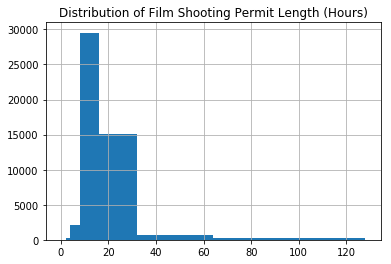

In [19]:
sp_data['FilmingTime'].hist(bins = [0,2,4,8,16,32,64,128])
plt.title('Distribution of Film Shooting Permit Length (Hours)')
plt.show()

In [20]:
sp_data = sp_data.loc[sp_data['FilmingTime'] <= np.quantile(sp_data['FilmingTime'], .99)].reset_index(drop = True)

In [21]:
sp_data = sp_data.loc[sp_data['StartDateTime_dt'] < datetime(2018, 10, 1)].reset_index(drop = True)

## Borough Analysis

In [22]:
borough_monthly_counts = sp_data.groupby(['Borough', 'StartYearMonth']).size().reset_index(name = 'Permit Count')
borough_quarterly_counts = sp_data.groupby(['Borough', 'StartQuarter']).size().reset_index(name = 'Permit Count')
overall_monthly_counts = sp_data.groupby(['StartYearMonth']).size().reset_index(name = 'Permit Count')
overall_quarterly_counts = sp_data.groupby(['StartQuarter']).size().reset_index(name = 'Permit Count')

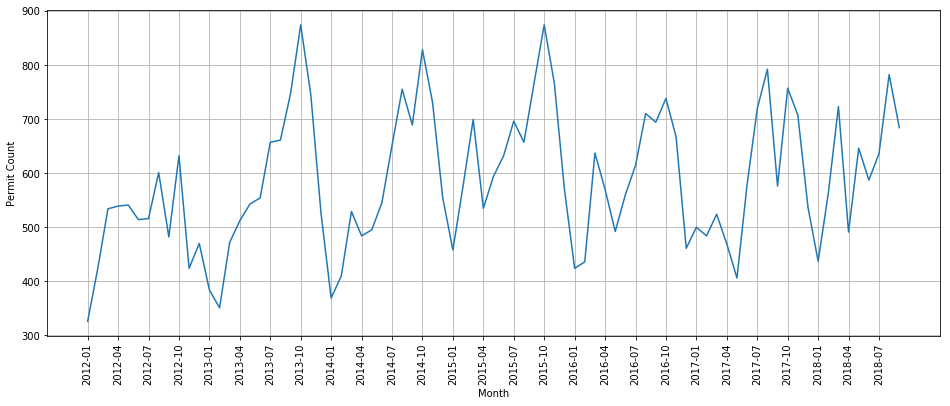

In [24]:
fig, ax = plt.subplots(figsize = (16,6))
plt.xticks(rotation = 90)
sns.lineplot(x="StartYearMonth", y ="Permit Count",  data=overall_monthly_counts)
plt.xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
plt.grid(True)
plt.xlabel('Month')
plt.show()

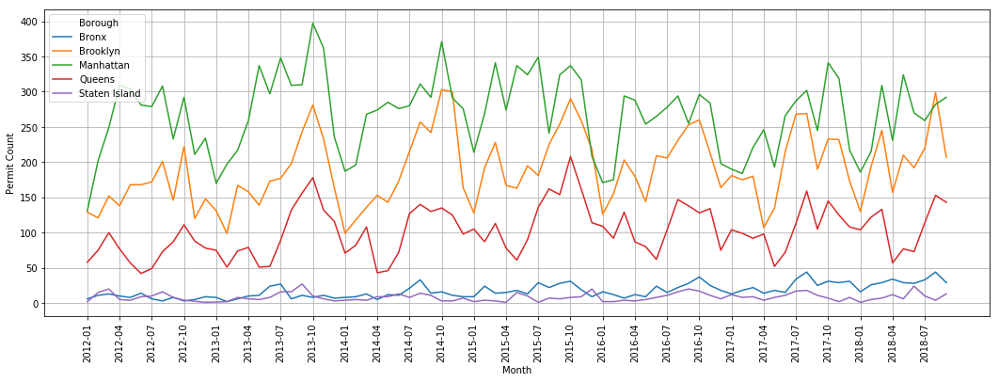

In [25]:
fig, ax = plt.subplots(figsize = (18,6))
plt.xticks(rotation = 90)
sns.lineplot(x="StartYearMonth", y ="Permit Count", hue = 'Borough', data=borough_monthly_counts)
plt.grid(True)
plt.xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
plt.xlabel('Month')
plt.show()

## Trend and Seasonality

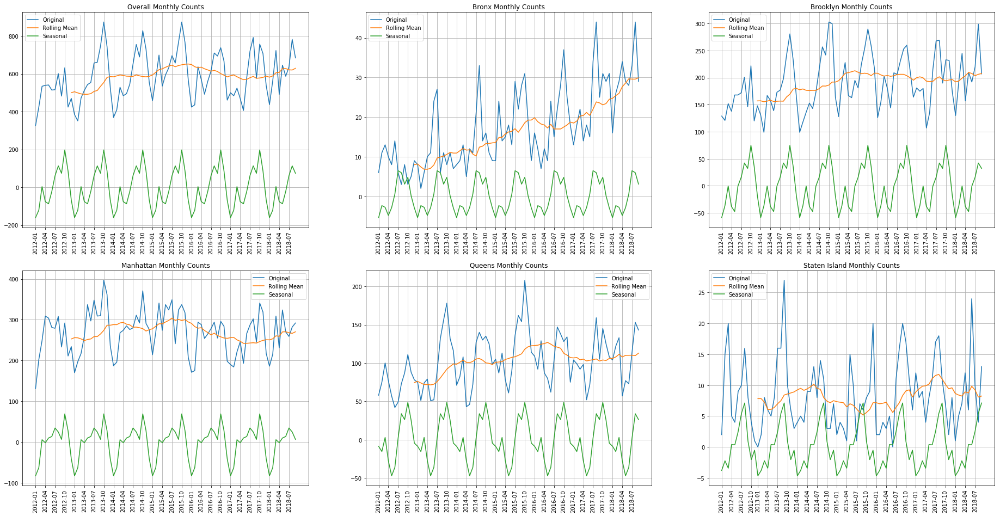

In [26]:
fig, ax = plt.subplots(2, 3, figsize=(32,16))
overall_timeseries = overall_monthly_counts['Permit Count']
overall_timeseries.index = overall_monthly_counts['StartYearMonth']
overall_timeseries_rolling = overall_timeseries.rolling(12).mean()
ax[0,0].plot(overall_timeseries, label = 'Original')
ax[0,0].plot(overall_timeseries_rolling, label = 'Rolling Mean')
overall_decomp = seasonal_decompose(overall_timeseries, freq = 12, model = 'additive')
ax[0,0].plot(overall_decomp.seasonal, label = 'Seasonal')
ax[0,0].set_title('Overall Monthly Counts')
ax[0,0].set_xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
ax[0,0].tick_params(axis = 'x', rotation = 90)
ax[0,0].grid(True)
ax[0,0].legend(loc = 'best')

bronx_timeseries = borough_monthly_counts['Permit Count'][borough_monthly_counts['Borough'] == 'Bronx']
bronx_timeseries.index = borough_monthly_counts['StartYearMonth'][borough_monthly_counts['Borough'] == 'Bronx']
bronx_timeseries_rolling = bronx_timeseries.rolling(12).mean()
ax[0,1].plot(bronx_timeseries, label = 'Original')
ax[0,1].plot(bronx_timeseries_rolling, label = 'Rolling Mean')
bronx_decomp = seasonal_decompose(bronx_timeseries, freq = 12, model = 'additive')
ax[0,1].plot(bronx_decomp.seasonal, label = 'Seasonal')
ax[0,1].set_title('Bronx Monthly Counts')
ax[0,1].set_xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
ax[0,1].tick_params(axis = 'x', rotation = 90)
ax[0,1].grid(True)
ax[0,1].legend(loc = 'best')

brklyn_timeseries = borough_monthly_counts['Permit Count'][borough_monthly_counts['Borough'] == 'Brooklyn']
brklyn_timeseries.index = borough_monthly_counts['StartYearMonth'][borough_monthly_counts['Borough'] == 'Brooklyn']
brklyn_timeseries_rolling = brklyn_timeseries.rolling(12).mean()
ax[0,2].plot(brklyn_timeseries, label = 'Original')
ax[0,2].plot(brklyn_timeseries_rolling, label = 'Rolling Mean')
brklyn_decomp = seasonal_decompose(brklyn_timeseries, freq = 12, model = 'additive')
ax[0,2].plot(brklyn_decomp.seasonal, label = 'Seasonal')
ax[0,2].set_title('Brooklyn Monthly Counts')
ax[0,2].set_xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
ax[0,2].tick_params(axis = 'x', rotation = 90)
ax[0,2].grid(True)
ax[0,2].legend(loc = 'best')

mnhtn_timeseries = borough_monthly_counts['Permit Count'][borough_monthly_counts['Borough'] == 'Manhattan']
mnhtn_timeseries.index = borough_monthly_counts['StartYearMonth'][borough_monthly_counts['Borough'] == 'Manhattan']
mnhtn_timeseries_rolling = mnhtn_timeseries.rolling(12).mean()
ax[1,0].plot(mnhtn_timeseries, label = 'Original')
ax[1,0].plot(mnhtn_timeseries_rolling, label = 'Rolling Mean')
mnhtn_decomp = seasonal_decompose(mnhtn_timeseries, freq = 12, model = 'additive')
ax[1,0].plot(mnhtn_decomp.seasonal, label = 'Seasonal')
ax[1,0].set_title('Manhattan Monthly Counts')
ax[1,0].set_xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
ax[1,0].tick_params(axis = 'x', rotation = 90)
ax[1,0].grid(True)
ax[1,0].legend(loc = 'best')

queens_timeseries = borough_monthly_counts['Permit Count'][borough_monthly_counts['Borough'] == 'Queens']
queens_timeseries.index = borough_monthly_counts['StartYearMonth'][borough_monthly_counts['Borough'] == 'Queens']
queens_timeseries_rolling = queens_timeseries.rolling(12).mean()
ax[1,1].plot(queens_timeseries, label = 'Original')
ax[1,1].plot(queens_timeseries_rolling, label = 'Rolling Mean')
queens_decomp = seasonal_decompose(queens_timeseries, freq = 12, model = 'additive')
ax[1,1].plot(queens_decomp.seasonal, label = 'Seasonal')
ax[1,1].set_title('Queens Monthly Counts')
ax[1,1].set_xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
ax[1,1].tick_params(axis = 'x', rotation = 90)
ax[1,1].grid(True)
ax[1,1].legend(loc = 'best')

si_timeseries = borough_monthly_counts['Permit Count'][borough_monthly_counts['Borough'] == 'Staten Island']
si_timeseries.index = borough_monthly_counts['StartYearMonth'][borough_monthly_counts['Borough'] == 'Staten Island']
si_timeseries['2013-01'] = 0
si_timeseries['2016-06'] = 0
si_timeseries = si_timeseries.reset_index().sort_values('StartYearMonth')
si_timeseries.index = si_timeseries['StartYearMonth']
si_timeseries = si_timeseries['Permit Count']
si_timeseries_rolling = si_timeseries.rolling(12).mean()
ax[1,2].plot(si_timeseries, label = 'Original')
ax[1,2].plot(si_timeseries_rolling, label = 'Rolling Mean')
si_decomp = seasonal_decompose(si_timeseries, freq = 12, model = 'additive')
ax[1,2].plot(si_decomp.seasonal, label = 'Seasonal')
ax[1,2].set_title('Staten Island Monthly Counts')
ax[1,2].set_xticks(['2012-01', '2012-04', '2012-07', '2012-10', '2013-01', '2013-04', '2013-07', '2013-10',
           '2014-01', '2014-04', '2014-07', '2014-10', '2015-01', '2015-04', '2015-07', '2015-10',
            '2016-01', '2016-04', '2016-07', '2016-10', '2017-01', '2017-04', '2017-07', '2017-10',
           '2018-01', '2018-04', '2018-07'])
ax[1,2].tick_params(axis = 'x', rotation = 90)
ax[1,2].grid(True)
ax[1,2].legend(loc = 'best')

plt.savefig('seasonal_decomp_plots.png', quality = 80)

## Police Precinct Analysis

In [27]:
# pp_explode = pd.DataFrame(columns=['EventID', 'CommunityBoard'])
# for i in range(0,len(data)):
#     for j in range(0, len(data['pp_list'][i])):
#         pp_explode = pp_explode.append({'EventID': data['EventID'][i],
#                                         'PolicePrecinct': data['pp_list'][i][j]}, ignore_index = True)
#     if i%10000 == 0:
#         print(i)


pol_prec = pd.read_csv('pp_explode.csv') # Done in above code and written out to save time. 
pol_prec = pol_prec.loc[~pol_prec['Precinct'].isnull()]
pol_prec['Precinct'] = pol_prec['Precinct'].astype('int').astype('str')
pol_prec.shape

(66127, 3)

In [28]:
precinct_data = pol_prec[['EventID', 'Precinct']].merge(sp_data[['EventID', 'StartYear']], on = 'EventID')

In [29]:
print(precinct_data.shape)
precinct_data.head(3)

(64900, 3)


,EventID,Precinct,StartYear
0,300134,20,2016
1,299797,108,2016
2,300179,108,2016


In [34]:
# GeoJSON for plotting Police Precincts
with open('police_precincts_2.json', 'r') as json_data:  
    precinct_json = json.load(json_data)

In [35]:
precinct_yearly_counts = precinct_data.groupby(['Precinct', 'StartYear']).size().reset_index(name = 'Permit Count')

In [37]:
precinct_yearly_pivot = precinct_yearly_counts.pivot(index = 'Precinct', columns = 'StartYear', values = 'Permit Count')
precinct_yearly_pivot = precinct_yearly_pivot.fillna(0)
precinct_yearly_pivot = precinct_yearly_pivot.reset_index()
precinct_yearly_pivot.head(2)

StartYear,Precinct,2012,2013,2014,2015,2016,2017,2018
0,0,6.0,8.0,1.0,0.0,0.0,0.0,0.0
1,1,460.0,489.0,422.0,605.0,393.0,345.0,409.0


## Plotting Counts Across Police Precincts

### Yearly Counts

In [41]:
cubed_scaling = [0, 8, 27, 64, 125, 216, 343, 512, 729, 1331]
year = 2017

m = folium.Map(location=[40.73, -74.05], zoom_start = 10.50, tiles = 'Stamen Toner')
m.choropleth(fill_opacity=0.7, threshold_scale = cubed_scaling,
             geo_data="police_precincts_2.json",
             name='choropleth',
             data=precinct_yearly_pivot,
             fill_color='YlGnBu',
             key_on='feature.id',
             columns=['Precinct', year])
m

### Total Counts

In [44]:
precinct_all_time_counts = precinct_data.groupby('Precinct').size().reset_index(name = 'Permit Count')
precinct_all_time_counts.sample(n = 2)

,Precinct,Permit Count
70,79,699
33,26,750


In [47]:
some_exp_scale = [15, 58, 169, 386, 757, 1339, 2195, 3394, 5012, 7131]
m = folium.Map(location=[40.73, -74.05], zoom_start = 10.50, tiles = 'Stamen Toner')
m.choropleth(geo_data="police_precincts_2.json",name='choropleth', fill_opacity=0.8,
             data=precinct_all_time_counts,fill_color='YlGnBu', threshold_scale = some_exp_scale, 
             key_on='feature.id', columns=['Precinct', 'Permit Count'])
m

In [48]:
m.save('total_yearly_counts.html')